# Getting Started with Images
This notebook for learning Image Processing and Computer Vision using OpenCV.

Experiments with:
- Reading an image
- Check image attributes like datatype and shape
- Matrix representation of an image in Numpy
- Color Images and splitting/merging image channels
- Displaying images using matplotlib
- Saving images
- Basic image manipulation: acessing pixels, cropping/resizing/flipping image
- Basic image enhancement: brightness, contrast, thresholding, bitwise operations

## Table of Contents
* [Download assets](#download-assets)
* [Display Image Directly](#display-image-directly)
* [Reading images using OpenCV](#read_using_opencv)
* [Display Images using Matplotlib](#display_using_matplotlib)
* [Working with Color Images](#color-images)
    * [Splitting and Merging Color Channels](#split-merger-color-channels)
    * [Converting to different Color Spaces](#convert-color-space)
    * [Changing to HSV color space](#HSV-color-space)
    * [Modifying individual Channel](#modify-channel)
* [Saving image](#save)
* [Basic Image Manipulation](#img-manipulation)
    * [Accessing Individual Pixels](#access-pixel)
    * [Modifying Image Pixels](#modify-pixel)
    * [Cropping Images](#crop)
    * [Resizing Images](#resize)
    * [Flipping Images](#flip)
* [Basic Image Enhancement Using Mathematical Operations](enhancement)
    * [Addition or Brightness](#addition)
    * [Multiplication or Contrast](#multiplication)
    * [Image Thresholding](#thresholding)
    * [Application: Sheet Music Reader](#app1)
    * [Bitwise Operations](#bitwise)
    * [Application: Logo Manipulation](#app2)
    

In [25]:
import os
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

from zipfile import ZipFile
from urllib.request import urlretrieve

from IPython.display import Image

In [2]:
cv.__version__

'4.8.0'

In [3]:
test_list = [[1, 2, 3, 4, 5], [6, 7, 8, 9, 10]]
np_array = np.array(test_list)
np_array.shape

(2, 5)

<a id='download-assets'></a>
## Download Assets
The `download_and_unzip(...)` is used to download and extract the notebook assests.

In [83]:
def download_and_unzip(url, zip_path, target_path):
    print(f"Downloading and extracting assests....")

    # Downloading zip file using urllib package.
    urlretrieve(url, zip_path)

    try:
        # Extracting zip file using the zipfile package.
        with ZipFile(zip_path) as z:
            # Extract ZIP file contents in the same directory.
            z.extractall(target_path)

        print("Finished. ZIP archive was deleted.")
        os.remove(zip_path)

    except Exception as e:
        print("\nInvalid file.", e)

In [131]:
URLS = [r"https://www.dropbox.com/s/qhhlqcica1nvtaw/opencv_bootcamp_assets_NB1.zip?dl=1",
        r"https://www.dropbox.com/s/rys6f1vprily2bg/opencv_bootcamp_assets_NB2.zip?dl=1",
        r"https://www.dropbox.com/s/48hboi1m4crv1tl/opencv_bootcamp_assets_NB3.zip?dl=1",
        r"https://www.dropbox.com/s/0oe92zziik5mwhf/opencv_bootcamp_assets_NB4.zip?dl=1"]

asset_zip_pathes = [os.path.join(os.getcwd(), "opencv_bootcamp_assets_NB1.zip"),
                    os.path.join(os.getcwd(), "opencv_bootcamp_assets_NB2.zip"),
                    os.path.join(os.getcwd(), "opencv_bootcamp_assets_NB3.zip"),
                    os.path.join(os.getcwd(), "opencv_bootcamp_assets_NB4.zip")]

asset_save_path = "images"
target_directory = os.path.join(os.getcwd(), asset_save_path)
print(target_directory)

for i in range(len(URLS)):
    url = URLS[i]
    asset_zip_path = asset_zip_pathes[i]
                    
    # create target dir if it does not exists.
    if not os.path.exists(target_directory):
        os.makedirs(target_directory)

    # Download if assest ZIP does not exists. 
    if not os.path.exists(asset_zip_path_1):
        download_and_unzip(url, asset_zip_path, target_directory)

D:\Dev\ml\projects\Sandbox\OpenCV\images
Finished. ZIP archive was deleted.
Finished. ZIP archive was deleted.
Finished. ZIP archive was deleted.
Finished. ZIP archive was deleted.


<a id="display-image-directly"></a>
## Display Image Directly

In [27]:
# Display 18x18 pixel image.
Image(filename="images/checkerboard_18x18.png")

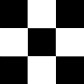

In [29]:
# Display 84x84 pixel image.
Image(filename="images/checkerboard_84x84.jpg")

<a id="read_using_opencv"></a>
## Reading images using OpenCV

OpenCV allows reading different types of images (JPG, PNG, etc). We can load grayscale images, color images or we can also load images with Alpha channel. It uses the **`cv2.imread()`** function which has the following syntax:

### <font color="green">Function Syntax </font>

``` python
retval = cv2.imread( filename[, flags] )
```

`retval`: Is the image if it is successfully loaded. Otherwise it is `None`. This may happen if the filename is wrong or the file is corrupt.

The function has **1 required input argument** and one optional flag:


1. `filename`: This can be an **absolute** or **relative** path. This is a **mandatory argument**.

2. `Flags`:    These flags are used to read an image in a particular format (for example, grayscale/color/with alpha channel). This is an **optional argument** with a default value of `cv2.IMREAD_COLOR` or `1` which loads the image as a color image.

Before we proceed with some examples, let's also have a look at some of the `flags` available.

**Flags**
1. **`cv2.IMREAD_GRAYSCALE`** or **`0`**: Loads image in grayscale mode
2. **`cv2.IMREAD_COLOR`** or **`1`**: Loads a color image. Any transparency of image will be neglected. It is the default flag.
3. **`cv2.IMREAD_UNCHANGED`** or **`-1`**: Loads image as such including alpha channel.


### <font color="green">OpenCV Documentation</font>

1. **`Imread`**:  <a href="https://docs.opencv.org/4.5.1/d4/da8/group__imgcodecs.html#ga288b8b3da0892bd651fce07b3bbd3a56" target="_blank">Documentation link</a>

2. **`ImreadModes`**: <a href="https://docs.opencv.org/4.5.1/d8/d6a/group__imgcodecs__flags.html#ga61d9b0126a3e57d9277ac48327799c80" target="_blank">Documentation link</a>

In [33]:
# Read image as gray scale.
cb_img = cv.imread("images/checkerboard_18x18.png", 0)

# Print the image data (pixel values), element of a 2D numpy array.
# Each pixel value is 8-bits [0,255]
print(cb_img)

<class 'numpy.ndarray'>
[[  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 

In [35]:
# print type of the container
print(type(cb_img))

# print the size  of image
print("Image size (H, W) is:", cb_img.shape)

# print data-type of image
print("Data type of image is:", cb_img.dtype)

<class 'numpy.ndarray'>
Image size (H, W) is: (18, 18)
Data type of image is: uint8


<a id="display_using_matplotlib"></a>
## Display Images using Matplotlib

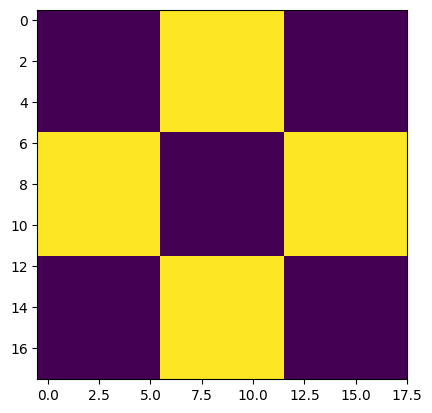

In [36]:
# Display image.
plt.imshow(cb_img)

Even though the image was read in as a gray scale image, it won't necessarily display in gray scale when using imshow(). matplotlib uses different color maps and it's possible that the gray scale color map is not set.

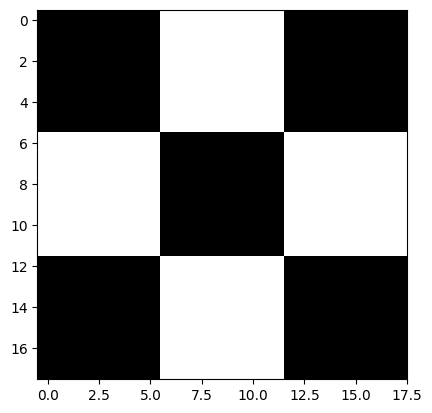

In [37]:
# Set color map to gray scale for proper rendering.
plt.imshow(cb_img, cmap="gray")

<a id="color-images"></a>
## Working with Color Images

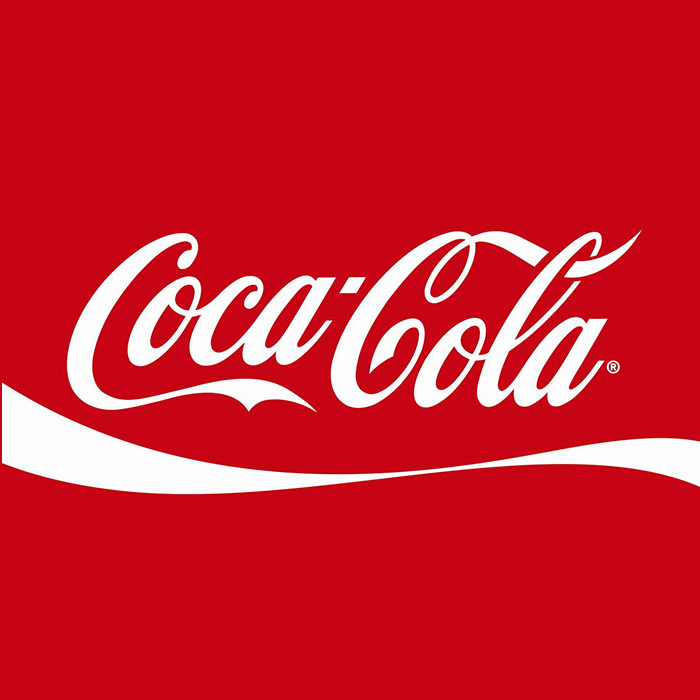

In [38]:
# Read and display Coca-Cola logo.
Image("images/coca-cola-logo.png")

In [55]:
# Read in image
coke_img = cv.imread("images/coca-cola-logo.png", 1)

# print the size  of image
print("Image size (H, W, C) is:", coke_img.shape)

# print data-type of image
print("Data type of image is:", coke_img.dtype)

Image size (H, W, C) is: (700, 700, 3)
Data type of image is: uint8


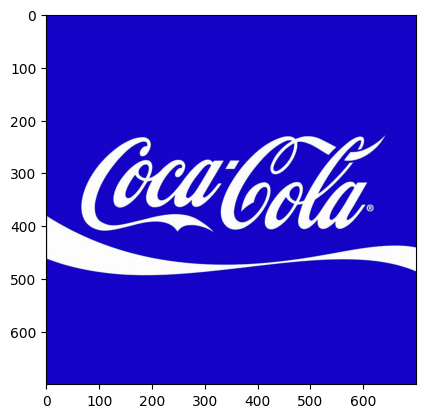

In [40]:
plt.imshow(coke_img)

The color displayed above is different from the actual image. This is because **matplotlib expects the image in RGB format** whereas **OpenCV stores images in BGR format**. Thus, for correct display, we need to reverse the channels of the image. We will discuss about the channels in the sections below.

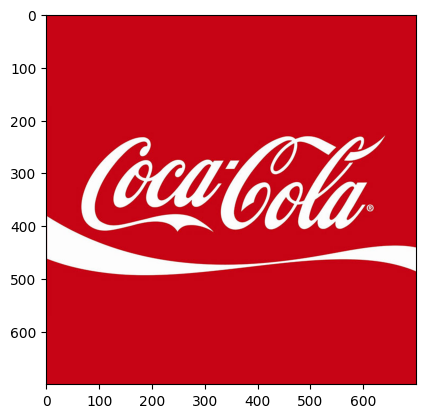

In [43]:
coke_img_channels_reversed = coke_img[:, :, ::-1]
plt.imshow(coke_img_channels_reversed)

<a id="split-merger-color-channels"></a>
### Splitting and Merging Color Channels
- `cv2.split()` Divides a multi-channel array into several single-channel arrays.

- `cv2.merge()` Merges several arrays to make a single multi-channel array. All the input matrices must have the same size.

#### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

<a href="https://docs.opencv.org/4.5.1/d2/de8/group__core__array.html#ga0547c7fed86152d7e9d0096029c8518a" target="_blank">Documentation link</a>

In [50]:
# Split the image into the B,G,R components
img_NZ_bgr = cv.imread("images/New_Zealand_Lake.jpg", cv.IMREAD_COLOR)
b, g, r = cv.split(img_NZ_bgr)

print(img_NZ_bgr.shape)
print(b.shape)

(600, 840, 3)
(600, 840)


Text(0.5, 1.0, 'Merged Output')

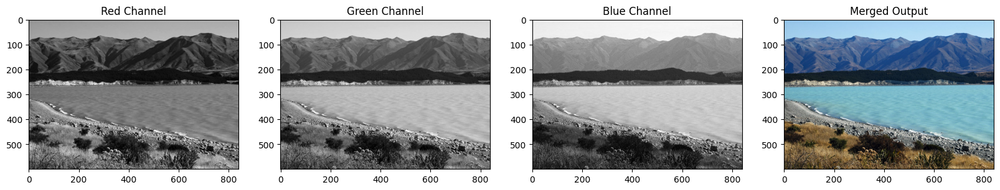

In [53]:
# Show the channels
plt.figure(figsize=[20, 5])

plt.subplot(141)
plt.imshow(r, cmap="gray")
plt.title("Red Channel")

plt.subplot(142);
plt.imshow(g, cmap="gray")
plt.title("Green Channel")

plt.subplot(143);
plt.imshow(b, cmap="gray")
plt.title("Blue Channel")

# Merge the individual channels into a BGR image
imgMerged = cv.merge((b, g, r))
# Show the merged output
plt.subplot(144)
plt.imshow(imgMerged[:, :, ::-1])
plt.title("Merged Output")

<a id="convert-color-space"></a>
###  Converting to different Color Spaces
`cv2.cvtColor()` Converts an image from one color space to another. The function converts an input image from one color space to another. In case of a transformation to-from RGB color space, the order of the channels should be specified explicitly (RGB or BGR). Note that the default color format in OpenCV is often referred to as RGB but it is actually BGR (the bytes are reversed). So the first byte in a standard (24-bit) color image will be an 8-bit Blue component, the second byte will be Green, and the third byte will be Red. The fourth, fifth, and sixth bytes would then be the second pixel (Blue, then Green, then Red), and so on.

#### <font style="color:rgb(8,133,37)">Function Syntax </font>
``` python
dst = cv2.cvtColor( src, code )
```

`dst`: Is the output image of the same size and depth as `src`.

The function has **2 required arguments**:

1. `src` input image: 8-bit unsigned, 16-bit unsigned ( CV_16UC... ), or single-precision floating-point.

2. `code` color space conversion code (see ColorConversionCodes). 

#### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

1. **`cv2.cvtColor`**: <a href="https://docs.opencv.org/3.4/d8/d01/group__imgproc__color__conversions.html#ga397ae87e1288a81d2363b61574eb8cab" target="_blank">Documentation link</a>  

2. **`ColorConversionCodes`**: <a href="https://docs.opencv.org/4.5.1/d8/d01/group__imgproc__color__conversions.html#ga4e0972be5de079fed4e3a10e24ef5ef0" target="_blank">Documentation link</a>
 

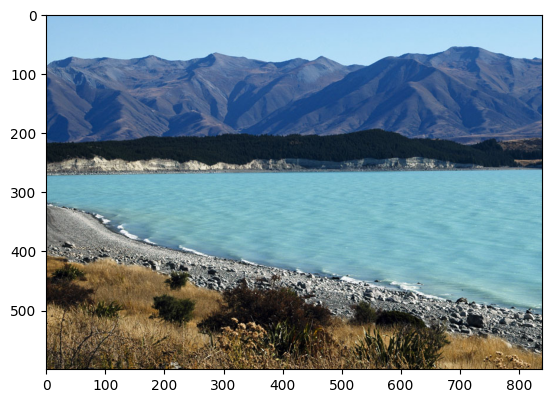

In [58]:
# OpenCV stores color channels in a differnet order than most other applications (BGR vs RGB).
img_NZ_rgb = cv.cvtColor(img_NZ_bgr, cv.COLOR_BGR2RGB)
plt.imshow(img_NZ_rgb)

<a id="HSV-color-space"></a>
### Changing to HSV color space
Hue, Saturation, and Value is a way to represent colors in a way that aligns more closely with how humans perceive them.

**Hue**: This represents the actual "color" itself, like red, green, blue, or any combination in between. Imagine a color wheel, where hue corresponds to your position on the wheel.

**Saturation**: This refers to the intensity or purity of the color. A highly saturated color is vibrant and vivid, while a low saturation is closer to a gray or pastel shade. Think of it as the amount of "ink" in color mixture.

**Value**: This determines the brightness or luminosity of the color. A high value is closer to white, while a low value is closer to black. It essentially controls how light or dark the color appears.


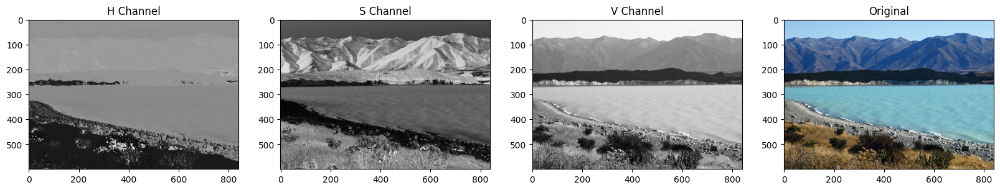

In [61]:
img_hsv = cv.cvtColor(img_NZ_bgr, cv.COLOR_BGR2HSV)

# Split the image into the B,G,R components
h,s,v = cv.split(img_hsv)

# Show the channels
plt.figure(figsize=[20,5])
plt.subplot(141);plt.imshow(h, cmap="gray");plt.title("H Channel");
plt.subplot(142);plt.imshow(s, cmap="gray");plt.title("S Channel");
plt.subplot(143);plt.imshow(v, cmap="gray");plt.title("V Channel");
plt.subplot(144);plt.imshow(img_NZ_rgb);   plt.title("Original");

<a id="modify-channel"></a>
### Modifying individual Channel

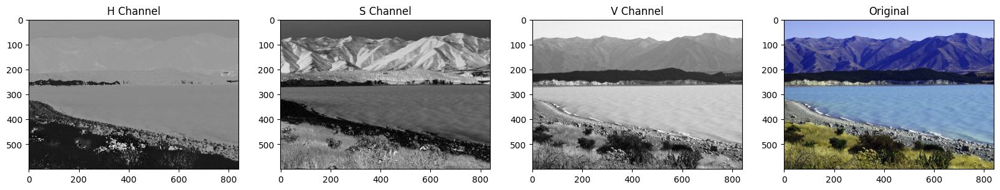

In [62]:
h_new = h + 10
img_NZ_merged = cv.merge((h_new, s, v))
img_NZ_rgb = cv.cvtColor(img_NZ_merged, cv.COLOR_HSV2RGB)

# Show the channels
plt.figure(figsize=[20,5])
plt.subplot(141);plt.imshow(h, cmap="gray");plt.title("H Channel");
plt.subplot(142);plt.imshow(s, cmap="gray");plt.title("S Channel");
plt.subplot(143);plt.imshow(v, cmap="gray");plt.title("V Channel");
plt.subplot(144);plt.imshow(img_NZ_rgb);   plt.title("Original");

<a id="save"></a>
## Saving Images

Saving the image is as trivial as reading an image in OpenCV. We use the function **`cv2.imwrite()`** with two arguments. The first one is the filename, second argument is the image object.

The function imwrite saves the image to the specified file. The image format is chosen based on the filename extension (see cv::imread for the list of extensions). In general, only 8-bit single-channel or 3-channel (with 'BGR' channel order) images can be saved using this function (see the OpenCV documentation for further details).

	
### <font style="color:rgb(8,133,37)">Function Syntax </font>
``` python
cv2.imwrite( filename, img[, params] )
```

The function has **2 required arguments**:

1. `filename`: This can be an **absolute** or **relative** path. 

2. `img`: Image or Images to be saved.

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

1. **`Imwrite`**: <a href="https://docs.opencv.org/4.5.1/d4/da8/group__imgcodecs.html#gabbc7ef1aa2edfaa87772f1202d67e0ce" target="_blank">Documentation link</a>

2. **`ImwriteFlags`**: <a href="https://docs.opencv.org/4.5.1/d8/d6a/group__imgcodecs__flags.html#ga292d81be8d76901bff7988d18d2b42ac" target="_blank">Documentation link</a>

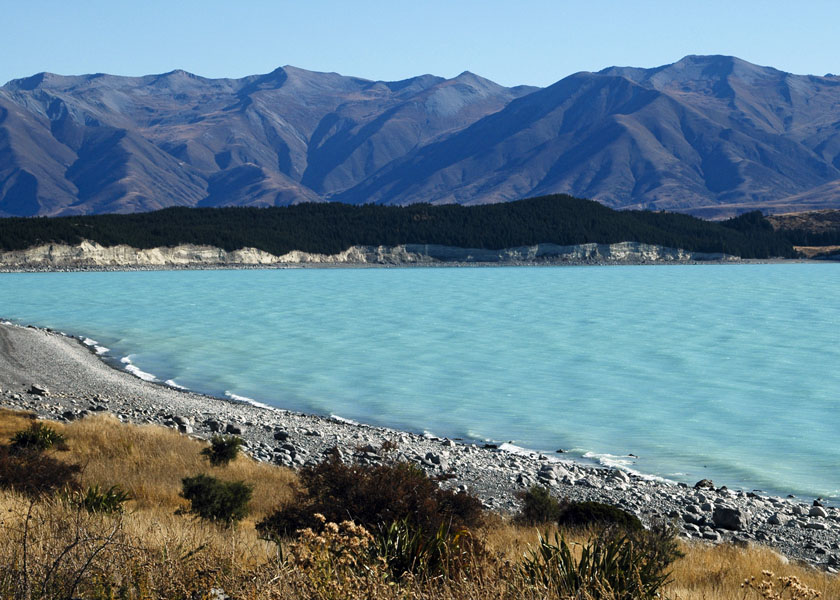

In [71]:
# save the image
output_path = os.path.join(target_directory, "New_Zealand_Lake_SAVED.png")
cv.imwrite(output_path, img_NZ_bgr)

Image(filename='images/New_Zealand_Lake_SAVED.png') 

In [70]:
# read the image as Color
img_NZ_bgr = cv.imread("images/New_Zealand_Lake_SAVED.png", cv.IMREAD_COLOR)
print("img_NZ_bgr shape (H, W, C) is:", img_NZ_bgr.shape)

# read the image as Grayscaled
img_NZ_gry = cv.imread("images/New_Zealand_Lake_SAVED.png", cv.IMREAD_GRAYSCALE)
print("img_NZ_gry shape (H, W) is:", img_NZ_gry.shape)

img_NZ_bgr shape (H, W, C) is: (600, 840, 3)
img_NZ_gry shape (H, W) is: (600, 840)


<a id="img-manipulation"></a>
## Basic Image Manipulation

<a id="access-pixel"></a>
### Accessing Individual Pixels
For accessing any pixel in a numpy matrix, you have to use matrix notation such as matrix[r,c], where the r is the row number and c is the column number. Also note that the matrix is 0-indexed.

In [72]:
# print the first pixel of the first black box
print(cb_img[0, 0])
# print the first white pixel to the right of the first black box
print(cb_img[0, 6])

0
255


<a id="modify-pixel"></a>
### Modifying Image Pixels
We can modify the intensity values of pixels in the same manner as described above.

[[  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0 200 200   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0 200 200   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0

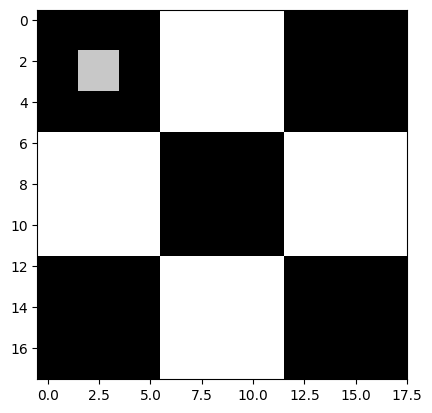

In [73]:
cb_img_copy = cb_img.copy()
cb_img_copy[2, 2] = 200
cb_img_copy[2, 3] = 200
cb_img_copy[3, 2] = 200
cb_img_copy[3, 3] = 200

# Same as above
# cb_img_copy[2:3,2:3] = 200

plt.imshow(cb_img_copy, cmap="gray")
print(cb_img_copy)

<a id="crop"></a>
### Cropping Images
Cropping an image is simply achieved by selecting a specific (pixel) region of the image.

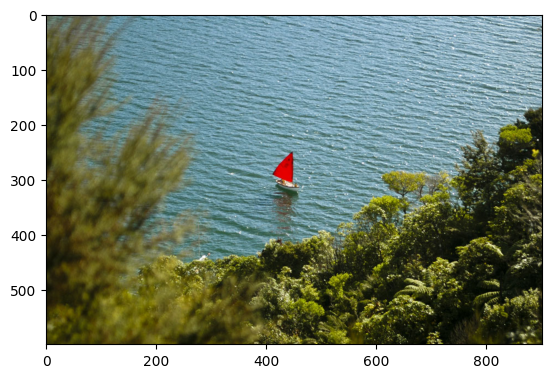

In [106]:
img_NZ_bgr = cv.imread("images/New_Zealand_Boat.jpg", cv.IMREAD_COLOR)
img_NZ_rgb = img_NZ_bgr[:, :, ::-1]

plt.imshow(img_NZ_rgb)

**Crop out the middle region of the image**

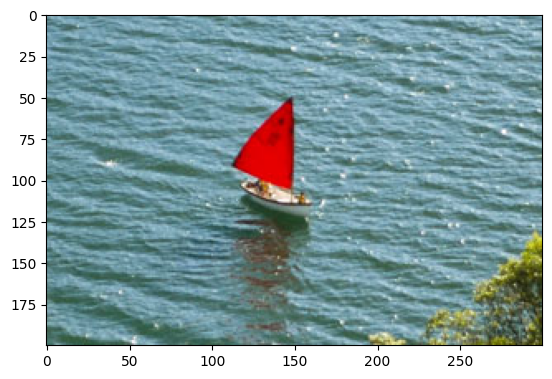

In [110]:
cropped_region = img_NZ_rgb[200:400, 300:600]
plt.imshow(cropped_region)

<a id="resize"></a>
### Resizing Images

The function **`resize`** resizes the image `src` down to or up to the specified size. The size and type are derived from the `src`,`dsize`,`fx`, and `fy`.

#### <font style="color:rgb(8,133,37)">Function Syntax </font>

``` python
dst = resize( src, dsize[, dst[, fx[, fy[, interpolation]]]] )
```

`dst`: output image; it has the size dsize (when it is non-zero) or the size computed from src.size(), fx, and fy; the type of dst is the same as of src.

The function has **2 required arguments**:
    
1. `src`:	input image

2. `dsize`: output image size

Optional arguments that are often used include:

1. `fx`: Scale factor along the horizontal axis; when it equals 0, it is computed as (𝚍𝚘𝚞𝚋𝚕𝚎)𝚍𝚜𝚒𝚣𝚎.𝚠𝚒𝚍𝚝𝚑/𝚜𝚛𝚌.𝚌𝚘𝚕𝚜

2. `fy`: Scale factor along the vertical axis; when it equals 0, it is computed as (𝚍𝚘𝚞𝚋𝚕𝚎)𝚍𝚜𝚒𝚣𝚎.𝚑𝚎𝚒𝚐𝚑𝚝/𝚜𝚛𝚌.𝚛𝚘𝚠𝚜

The output image has the size `dsize` (when it is non-zero) or the size computed from `src.size()`, `fx`, and `fy`; the type of dst is the same as of src.

#### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

**`resize()`**: <a href="https://docs.opencv.org/4.5.0/da/d54/group__imgproc__transform.html#ga47a974309e9102f5f08231edc7e7529d" target="_blank">Documentation link</a>

#### <font color="green"> Method 1: Specifying Scaling Factor using fx and fy


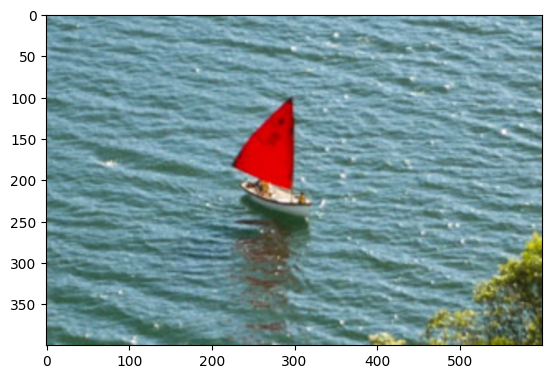

In [111]:
resized_cropped_region_2x = cv.resize(cropped_region, None, fx=2, fy=2)
plt.imshow(resized_cropped_region_2x)

#### <font color="green">Method 2: Specifying exact size of the output image</font>

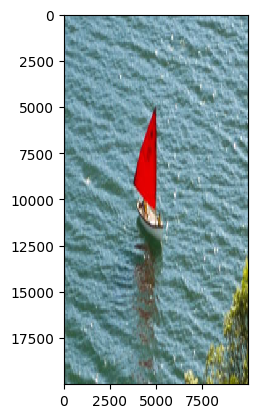

In [113]:
desired_width = 100
desired_height = 200
dim = (desired_width, desired_height)

# Resize background image to sae size as logo image
resized_cropped_region = cv.resize(cropped_region, dsize=dim, interpolation=cv.INTER_AREA)
plt.imshow(resized_cropped_region)

#### <font color="green">Resize while maintaining aspect ratio</font>

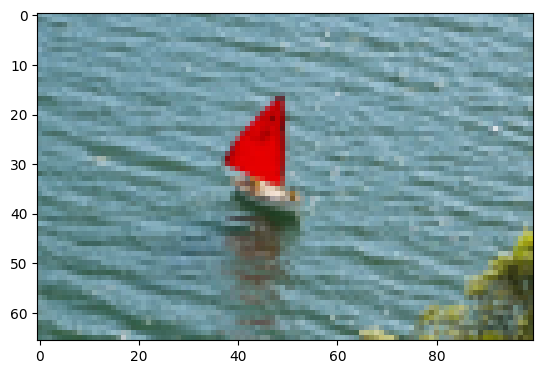

In [98]:
# Method 2: Using 'dsize'
desired_width = 100
aspect_ratio = desired_width / cropped_region.shape[1]
desired_height = int(cropped_region.shape[0] * aspect_ratio)
dim = (desired_width, desired_height)

# Resize image
resized_cropped_region = cv.resize(cropped_region, dsize=dim, interpolation=cv.INTER_AREA)
plt.imshow(resized_cropped_region)

### <font style="color:rgb(8,133,37)">Let's actually show the (cropped) resized image.</font>

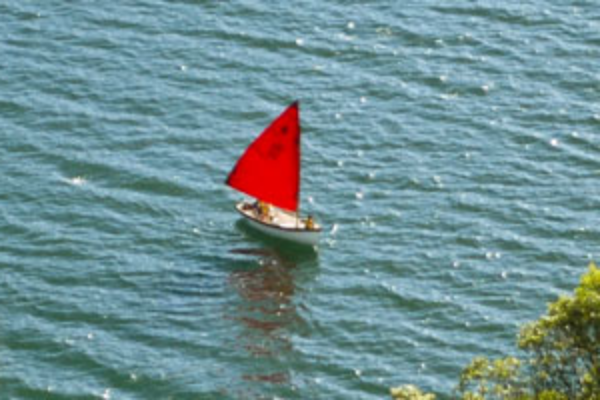

In [103]:
# Swap channel order
resized_cropped_region_2x = resized_cropped_region_2x[:, :, ::-1]

# Save resized image to disk
img_output_path = os.path.join(target_directory, "resized_cropped_region_2x.png")
cv.imwrite(img_output_path, resized_cropped_region_2x)

# Display the cropped and resized image
Image(filename="images/resized_cropped_region_2x.png")

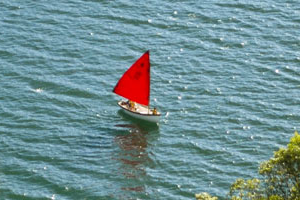

In [104]:
# Swap channel order
cropped_region = cropped_region[:, :, ::-1]

# Save cropped 'region'
img_output_path = os.path.join(target_directory, "cropped_region.png")
cv.imwrite(img_output_path, cropped_region)

# Display the cropped and resized image
Image(filename="images/cropped_region.png")

<a id="flip"></a>
### Flipping Images


The function **`flip`** flips the array in one of three different ways (row and column indices are 0-based):

### <font style="color:rgb(8,133,37)">Function Syntax </font>
``` python
dst = cv.flip( src, flipCode )
```

`dst`: output array of the same size and type as src.

The function has **2 required arguments**:
    
1. `src`:	input image
2. `flipCode`: a flag to specify how to flip the array; 0 means flipping around the x-axis and positive value (for example, 1) means flipping around y-axis. Negative value (for example, -1) means flipping around both axes.


### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

**`flip`**: <a href="https://docs.opencv.org/4.5.0/d2/de8/group__core__array.html#gaca7be533e3dac7feb70fc60635adf441" target="_blank">Documentation link</a>

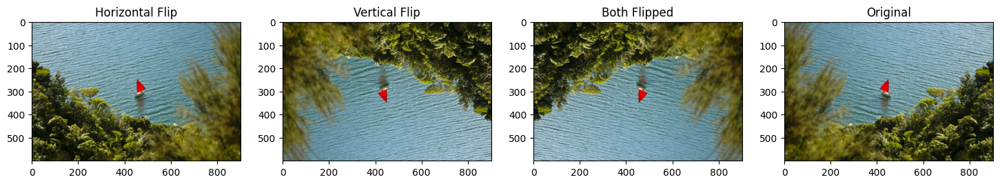

In [105]:
img_NZ_rgb_flipped_horz = cv.flip(img_NZ_rgb, 1)
img_NZ_rgb_flipped_vert = cv.flip(img_NZ_rgb, 0)
img_NZ_rgb_flipped_both = cv.flip(img_NZ_rgb, -1)

# Show the images
plt.figure(figsize=(18, 5))
plt.subplot(141);plt.imshow(img_NZ_rgb_flipped_horz);plt.title("Horizontal Flip");
plt.subplot(142);plt.imshow(img_NZ_rgb_flipped_vert);plt.title("Vertical Flip");
plt.subplot(143);plt.imshow(img_NZ_rgb_flipped_both);plt.title("Both Flipped");
plt.subplot(144);plt.imshow(img_NZ_rgb);plt.title("Original");


<a id="annotating"></a>
## Annotating Images

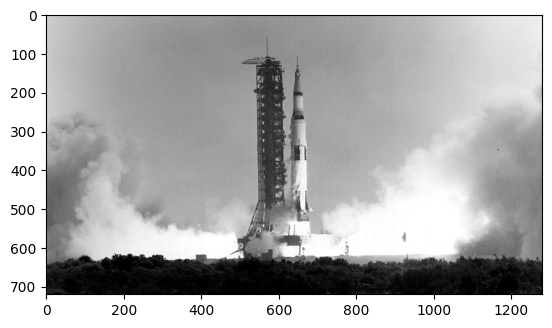

In [117]:
# Read in an image
image = cv.imread("images/Apollo_11_Launch.jpg", cv.IMREAD_COLOR)

# Display the original image
plt.imshow(image[:, :, ::-1])

<a id="draw-line"></a>
### <font style="color:black">Drawing a Line</font>


Let's start off by drawing a line on an image. We will use cv2.line function for this.

#### <font style="color:rgb(8,133,37)">Function Syntx</font>
``` python
    img = cv.line(img, pt1, pt2, color[, thickness[, lineType[, shift]]])
```

`img`: The output image that has been annotated.

The function has **4 required arguments**:

1. `img`:   Image on which we will draw a line

2. `pt1`:   First point(x,y location) of the line segment

3. `pt2`:   Second point of the line segment

4. `color`: Color of the line which will be drawn
    
Other optional arguments that are important for us to know include:

1. `thickness`: Integer specifying the line thickness. Default value is 1.

2. `lineType`:  Type of the line. Default value is 8 which stands for an 8-connected line. Usually, cv2.LINE_AA (antialiased or smooth line) is used for the lineType.
    
#### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

**`line`**: <a href="https://docs.opencv.org/4.5.1/d6/d6e/group__imgproc__draw.html#ga7078a9fae8c7e7d13d24dac2520ae4a2" target="_blank">Documentation link</a>

Let's see an example of this.

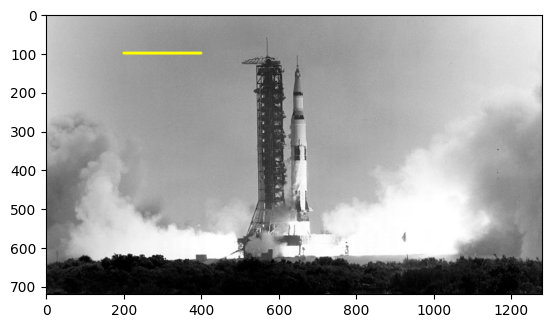

In [120]:
imageLine = image.copy()

# The line starts from (200,100) and ends at (400,100)
# The color of the line is YELLOW (Recall that OpenCV uses BGR format)
# Thickness of line is 5px
# Linetype is cv2.LINE_AA

cv.line(imageLine, (200, 100), (400, 100), (0, 255, 255), thickness=5, lineType=cv.LINE_AA);

# Display the image
plt.imshow(imageLine[:,:,::-1])

<a id="draw-circle"></a>
### <font style="color:black">Drawing a Circle</font>


Let's start off by drawing a circle on an image. We will use cv2.circle function for this.

#### <font style="color:rgb(8,133,37)">Functional syntx</font>
``` python
img = cv.circle(img, center, radius, color[, thickness[, lineType[, shift]]])
```

`img`: The output image that has been annotated.

The function has **4 required arguments**:

1. `img`:    Image on which we will draw a line

2. `center`: Center of the circle

3. `radius`: Radius of the circle

4. `color`:  Color of the circle which will be drawn
    
Next, let's check out the (optional) arguments which we are going to use quite extensively.

1. `thickness`: Thickness of the circle outline (if positive). 
If a negative value is supplied for this argument, it will result in a filled circle.

2. `lineType`:  Type of the circle boundary. This is exact same as lineType argument in **cv2.line**
    
#### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>
    
**`circle`**: <a href="https://docs.opencv.org/4.5.1/d6/d6e/group__imgproc__draw.html#gaf10604b069374903dbd0f0488cb43670" target="_blank">Documentation link</a>

Let's see an example of this.

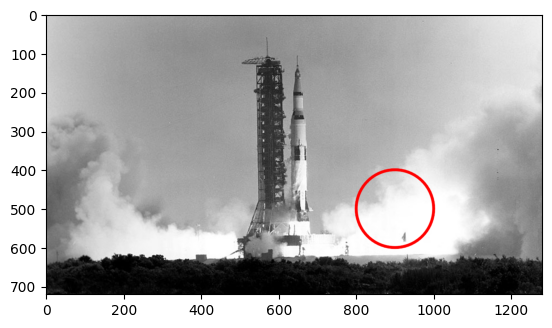

In [121]:
# Draw a circle
imageCircle = image.copy()

cv.circle(imageCircle, (900,500), 100, (0, 0, 255), thickness=5, lineType=cv.LINE_AA);

# Display the image
plt.imshow(imageCircle[:,:,::-1])

<a id="draw-rectangle"></a>
### <font style="color:black">Drawing a Rectangle</font>


We will use **cv2.rectangle** function to draw a rectangle on an image. The function syntax is as follows.

#### <font style="color:rgb(8,133,37)">Functional syntx</font>

    img = cv.rectangle(img, pt1, pt2, color[, thickness[, lineType[, shift]]])

`img`: The output image that has been annotated.

The function has **4 required arguments**:

1. `img`: Image on which the rectangle is to be drawn.

2. `pt1`: Vertex of the rectangle. Usually we use the **top-left vertex** here.

3. `pt2`: Vertex of the rectangle opposite to pt1. Usually we use the **bottom-right** vertex here.

4. `color`: Rectangle color
    
Next, let's check out the (optional) arguments which we are going to use quite extensively.

1. `thickness`: Thickness of the circle outline (if positive). If a negative value is supplied for this argument, it will result in a filled rectangle.

2. `lineType`: Type of the circle boundary. This is exact same as lineType argument in 
    **cv2.line**
    
#### <font style="color:rgb(8,133,37)">OpenCV Documentation Links</font>

**`rectangle`**: <a href="https://docs.opencv.org/4.5.1/d6/d6e/group__imgproc__draw.html#ga07d2f74cadcf8e305e810ce8eed13bc9" target="_blank">Documentation link</a>
   
Let's see an example of this.

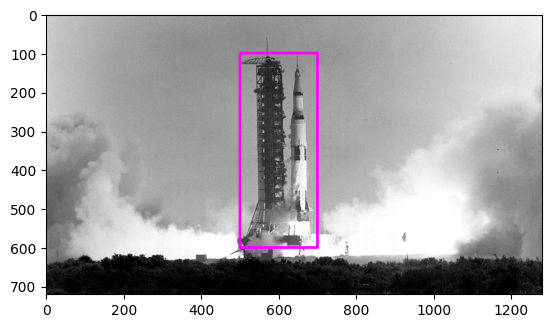

In [130]:
# Draw a rectangle (thickness is a positive integer)
imageRectangle = image.copy()

cv.rectangle(imageRectangle, (500, 100), (700, 600), (255, 0, 255), thickness=5, lineType=cv.LINE_8)

# Display the image
plt.imshow(imageRectangle[:, :, ::-1])

<a id="text"></a>
### <font style="color:black">Adding Text</font>


Finally, let's see how we can write some text on an image using **cv2.putText** function.

#### <font style="color:rgb(8,133,37)">Functional syntx</font>

    img = cv.putText(img, text, org, fontFace, fontScale, color[, thickness[, lineType[, bottomLeftOrigin]]])

`img`: The output image that has been annotated.

The function has **6 required arguments**:

1. `img`: Image on which the text has to be written.

2. `text`: Text string to be written.

3. `org`: Bottom-left corner of the text string in the image.

4. `fontFace`: Font type

5. `fontScale`: Font scale factor that is multiplied by the font-specific base size.

6. `color`: Font color
 
Other optional arguments that are important for us to know include:

1. `thickness`: Integer specifying the line thickness for the text. Default value is 1.

2. `lineType`: Type of the line. Default value is 8 which stands for an 8-connected line. Usually, cv2.LINE_AA (antialiased or smooth line) is used for the lineType.

#### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

**`putText`**: <a href="https://docs.opencv.org/4.5.1/d6/d6e/group__imgproc__draw.html#ga5126f47f883d730f633d74f07456c576" target="_blank">Documentation link</a>
    
Let's see an example of this.

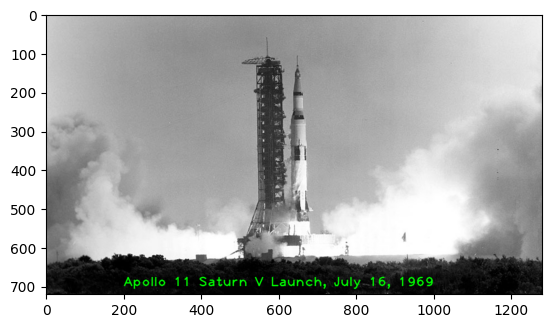

In [128]:
imageText = image.copy()
text = "Apollo 11 Saturn V Launch, July 16, 1969"
fontScale = 2.3
fontFace = cv.FONT_HERSHEY_PLAIN
fontColor = (0, 255, 0)
fontThickness = 2

cv.putText(imageText, text, (200, 700), fontFace, fontScale, fontColor, fontThickness, cv.LINE_AA);

# Display the image
plt.imshow(imageText[:, :, ::-1])

<a id="enhancement"></a>
## Basic Image Enhancement Using Mathematical Operations

Original image:

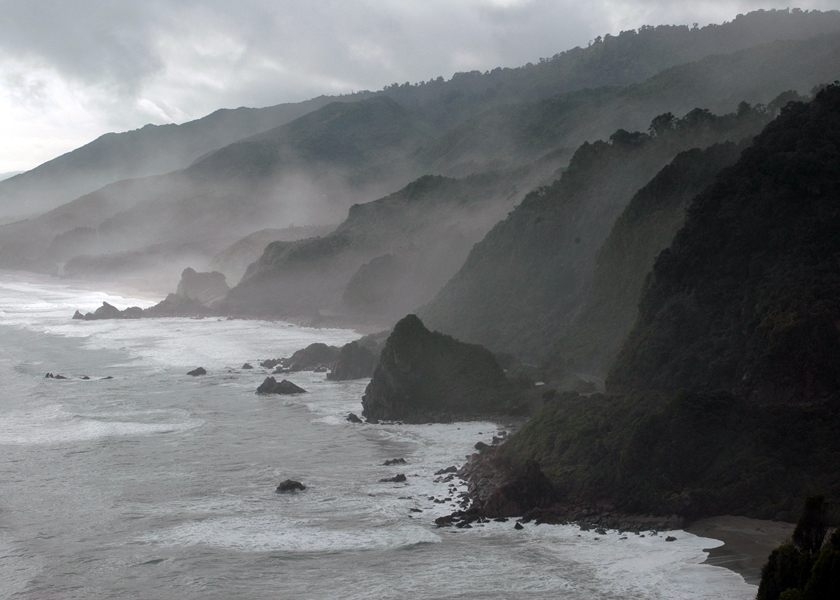

In [133]:
img_bgr = cv.imread("images/New_Zealand_Coast.jpg", cv.IMREAD_COLOR)
img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)

# Display 18x18 pixel image.
Image(filename="images/New_Zealand_Coast.jpg")

<a id='addition'></a>
### Addition or Brightness
This results in increasing or decreasing the brightness of the image since we are eventually increasing or decreasing the intensity values of each pixel by the same amount. So, this will result in a global increase/decrease in brightness.

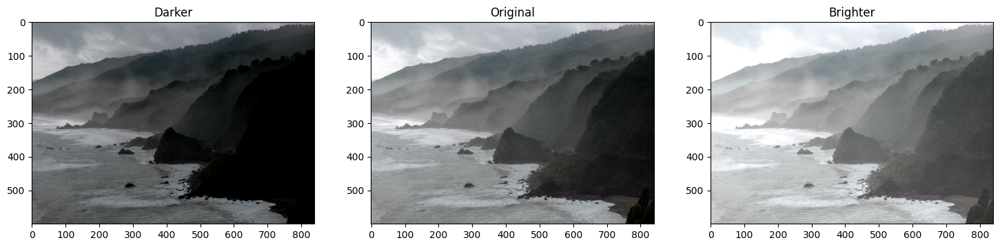

In [134]:
matrix = np.ones(img_rgb.shape, dtype="uint8") * 50

img_rgb_brighter = cv.add(img_rgb, matrix)
img_rgb_darker   = cv.subtract(img_rgb, matrix)


# Show the images
plt.figure(figsize=[18, 5])
plt.subplot(131); plt.imshow(img_rgb_darker);  plt.title("Darker");
plt.subplot(132); plt.imshow(img_rgb);         plt.title("Original");
plt.subplot(133); plt.imshow(img_rgb_brighter);plt.title("Brighter");

<a id='multiplication'></a>
### Multiplication or Contrast
Multiplication can be used to improve the contrast of the image.

Contrast is the difference in the intensity values of the pixels of an image. Multiplying the intensity values with a constant can make the difference larger or smaller ( if multiplying factor is < 1 ).

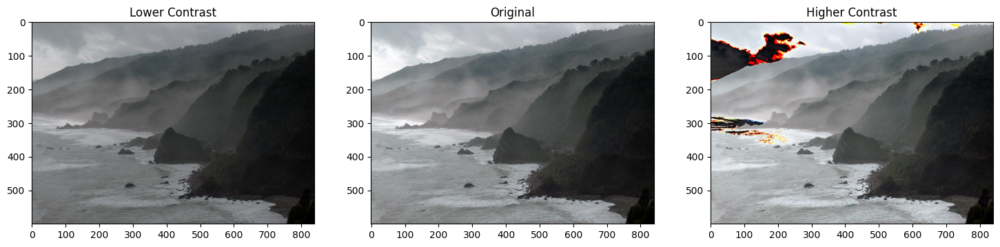

In [137]:
matrix1 = np.ones(img_rgb.shape) * 0.8
matrix2 = np.ones(img_rgb.shape) * 1.2

img_rgb_darker   = np.uint8(cv.multiply(np.float64(img_rgb), matrix1))
img_rgb_brighter = np.uint8(cv.multiply(np.float64(img_rgb), matrix2))

# Show the images
plt.figure(figsize=[18,5])
plt.subplot(131); plt.imshow(img_rgb_darker);  plt.title("Lower Contrast");
plt.subplot(132); plt.imshow(img_rgb);         plt.title("Original");
plt.subplot(133); plt.imshow(img_rgb_brighter);plt.title("Higher Contrast");

We can see the weird colors in some areas of the image after multiplication.
The issue is that after multiplying, the values which are already high, are becoming greater than 255. Thus, the overflow issue. How do we overcome this? Using **`np.clip`**

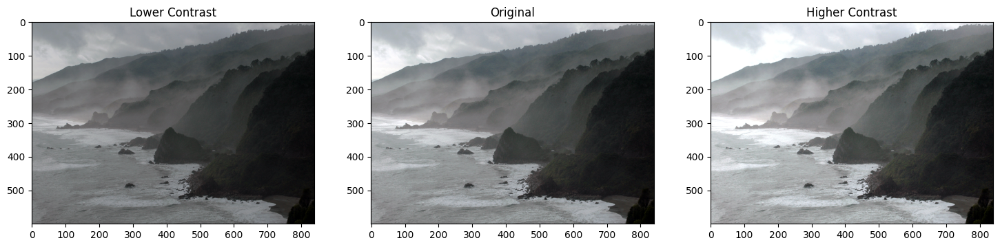

In [138]:
matrix1 = np.ones(img_rgb.shape) * 0.8
matrix2 = np.ones(img_rgb.shape) * 1.2

img_rgb_lower  = np.uint8(cv.multiply(np.float64(img_rgb), matrix1))
img_rgb_higher = np.uint8(np.clip(cv.multiply(np.float64(img_rgb), matrix2), 0, 255))

# Show the images
plt.figure(figsize=[18,5])
plt.subplot(131); plt.imshow(img_rgb_lower); plt.title("Lower Contrast");
plt.subplot(132); plt.imshow(img_rgb);       plt.title("Original");
plt.subplot(133); plt.imshow(img_rgb_higher);plt.title("Higher Contrast");

<a id='thresholding'></a>
### Image Thresholding
Binary Images have a lot of use cases in Image Processing. One of the most common use cases is that of creating masks. Image Masks allow us to process on specific parts of an image keeping the other parts intact. Image Thresholding is used to create Binary Images from grayscale images. You can use different thresholds to create different binary images from the same original image. 

#### <font color="green">Function Syntax </font>

``` python
retval, dst = cv2.threshold( src, thresh, maxval, type[, dst] )
```

`dst`: The output array of the same size and type and the same number of channels as `src`.

The function has **4 required arguments**:

1. `src`: input array (multiple-channel, 8-bit or 32-bit floating point).

2. `thresh`: threshold value. Pixels with values above to this value are set to `maxval`, while those below are set to 0.

3. `maxval`: maximum value to use with the THRESH_BINARY and THRESH_BINARY_INV thresholding types.

4. `type`: thresholding type (see ThresholdTypes).


#### <font color="green">Function Syntax </font>

``` python
dst = cv.adaptiveThreshold( src, maxValue, adaptiveMethod, thresholdType, blockSize, C[, dst] )
```

`dst`	Destination image of the same size and the same type as src.

The function has **6 required arguments**:
1. `src`:	Source 8-bit single-channel image.

2. `maxValue`:	Non-zero value assigned to the pixels for which the condition is satisfied

3. `adaptiveMethod`:	Adaptive thresholding algorithm to use, see AdaptiveThresholdTypes. The BORDER_REPLICATE | BORDER_ISOLATED is used to process boundaries.

4. `thresholdType:`	Thresholding type that must be either THRESH_BINARY or THRESH_BINARY_INV, see ThresholdTypes.

5. `blockSize`:	Size of a pixel neighborhood that is used to calculate a threshold value for the pixel: 3, 5, 7, and so on.

6. `C`:	Constant subtracted from the mean or weighted mean (see the details below). Normally, it is positive but may be zero or negative as well.

#### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

<a href="https://docs.opencv.org/4.5.1/d7/d1b/group__imgproc__misc.html#gae8a4a146d1ca78c626a53577199e9c57
https://docs.opencv.org/4.5.1/d7/d4d/tutorial_py_thresholding.html" target="_blank">Documentation link</a>

(572, 800)


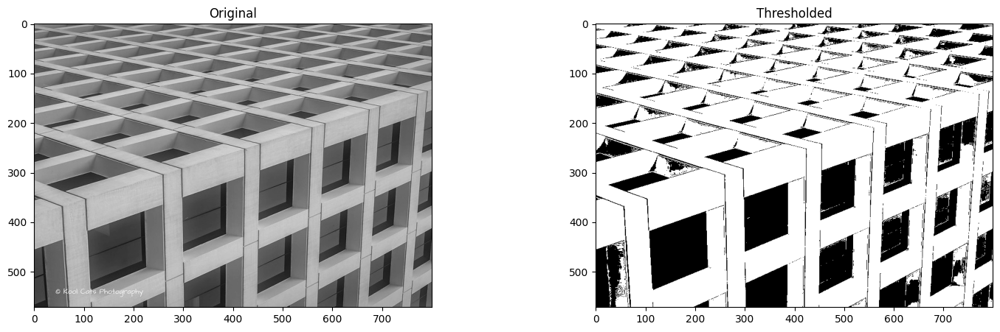

In [141]:
img_read = cv.imread("images/building-windows.jpg", cv.IMREAD_GRAYSCALE)
retval, img_thresh = cv.threshold(img_read, 100, 255, cv.THRESH_BINARY)

# Show the images
plt.figure(figsize=[18, 5])

plt.subplot(121);plt.imshow(img_read, cmap="gray");  plt.title("Original")
plt.subplot(122);plt.imshow(img_thresh, cmap="gray");plt.title("Thresholded")

print(img_thresh.shape)

<a id='app1'></a>
### Application: Sheet Music Reader
Suppose you wanted to build an application that could read (decode) sheet music. This is similar to Optical Character Recognigition (OCR) for text documents where the goal is to recognize text characters. In either application, one of the first steps in the processing pipeline is to isolate the important information in the image of a document (separating it from the background). This task can be accomplished with thresholding techniques. Let's take a look at an example.

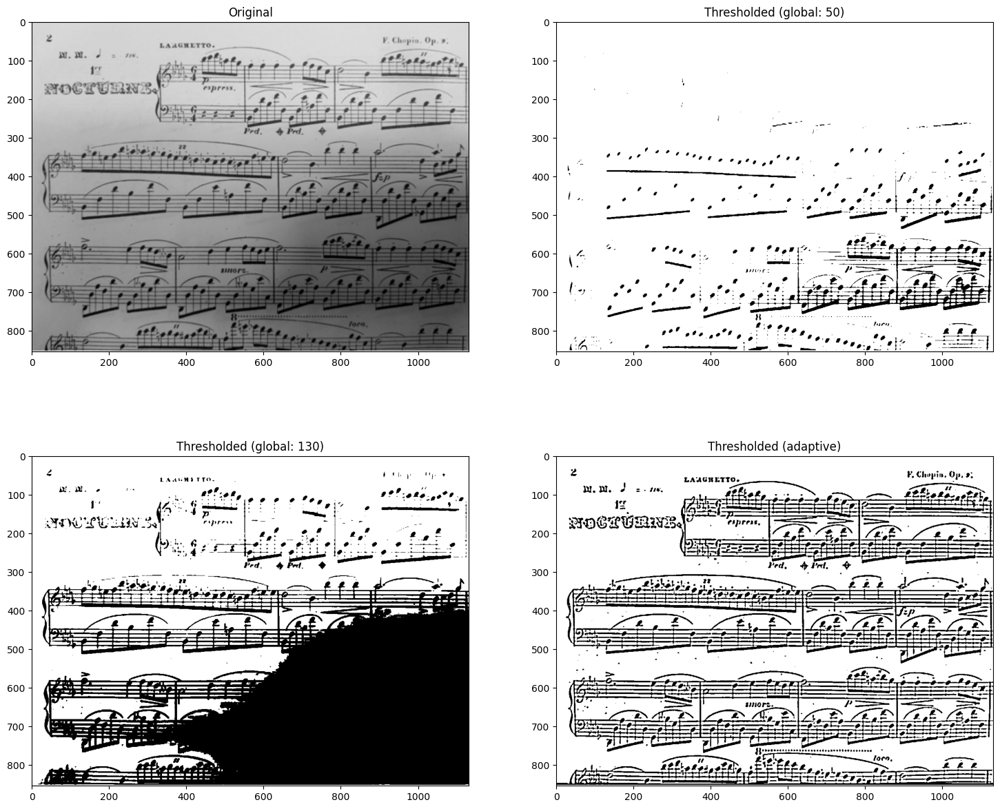

In [184]:
# Read the original image
img_read = cv.imread("images/Piano_Sheet_Music.png", cv.IMREAD_GRAYSCALE)

# Perform global thresholding
retval, img_thresh_gbl_1 = cv.threshold(img_read, 50, 255, cv.THRESH_BINARY)

# Perform global thresholding
retval, img_thresh_gbl_2 = cv.threshold(img_read, 130, 255, cv.THRESH_BINARY)

# Perform adaptive thresholding
img_thresh_adp = cv.adaptiveThreshold(img_read, 255, cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY, 11, 7)

# Show the images
plt.figure(figsize=[18,15])
plt.subplot(221); plt.imshow(img_read,        cmap="gray");  plt.title("Original");
plt.subplot(222); plt.imshow(img_thresh_gbl_1,cmap="gray");  plt.title("Thresholded (global: 50)");
plt.subplot(223); plt.imshow(img_thresh_gbl_2,cmap="gray");  plt.title("Thresholded (global: 130)");
plt.subplot(224); plt.imshow(img_thresh_adp,  cmap="gray");  plt.title("Thresholded (adaptive)");

<a id='bitwise'></a>
### Bitwise Operations

#### <font style="color:rgb(8,133,37)">Function Syntax</font>

Example API for `cv2.bitwise_and()`. Others include: `cv2.bitwise_or()`, `cv2.bitwise_xor()`, `cv2.bitwise_not()`

``` python
dst = cv2.bitwise_and( src1, src2[, dst[, mask]] )
```

`dst`: Output array that has the same size and type as the input arrays.

The function has **2 required arguments**:

1. `src1`:	first input array or a scalar.

2. `src2`:	second input array or a scalar.

An important optional argument is:

1. `mask`:	optional operation mask, 8-bit single channel array, that specifies elements of the output array to be changed.


#### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

1. <a href="https://docs.opencv.org/4.5.1/d0/d86/tutorial_py_image_arithmetics.html" target="_blank">Arithmetic Operations on Images</a>

2. <a href="https://docs.opencv.org/4.5.0/d2/de8/group__core__array.html#ga60b4d04b251ba5eb1392c34425497e14" target="_blank">bitwise_and(...) function</a>

(200, 499)


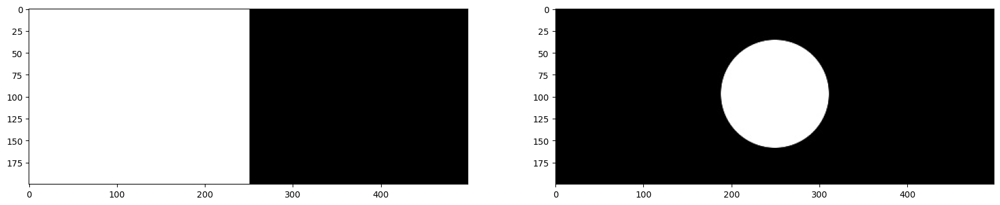

In [153]:
img_rec = cv.imread("images/rectangle.jpg", cv.IMREAD_GRAYSCALE)

img_cir = cv.imread("images/circle.jpg", cv.IMREAD_GRAYSCALE)

plt.figure(figsize=[20, 5])
plt.subplot(121);plt.imshow(img_rec, cmap="gray")
plt.subplot(122);plt.imshow(img_cir, cmap="gray")
print(img_rec.shape)

<a id='and'></a>
#### Bitwise AND Operator

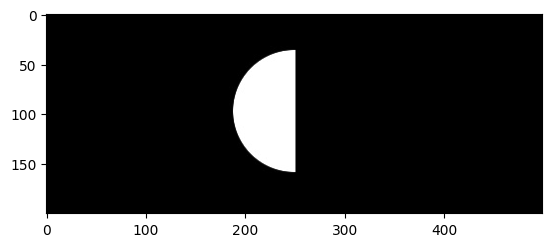

In [161]:
result = cv.bitwise_and(img_rec, img_cir, mask=None)
plt.imshow(result, cmap="gray")

<a id='or'></a>
#### Bitwise OR Operator

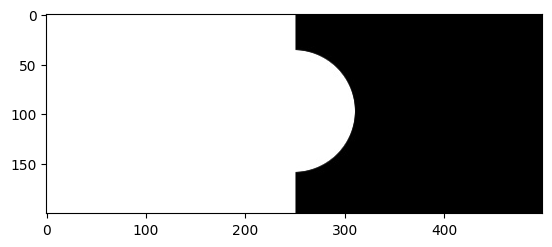

In [163]:
result = cv.bitwise_or(img_rec, img_cir, mask=None)
plt.imshow(result, cmap="gray")

<a id='xor'></a>
#### Bitwise XOR Operator

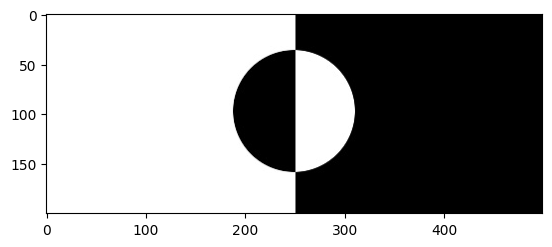

In [169]:
result = cv.bitwise_xor(img_rec, img_cir, mask=None)
plt.imshow(result, cmap="gray")

<a id='app2'></a>
### Application: Logo Manipulation

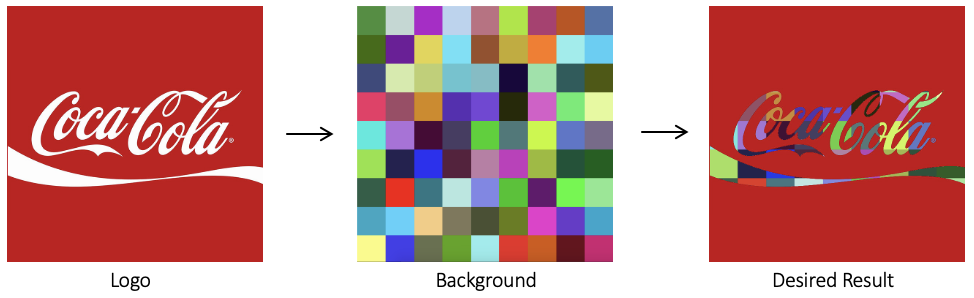

In [170]:
Image(filename='images/Logo_Manipulation.png')

**Read Foreground image**

(700, 700, 3)


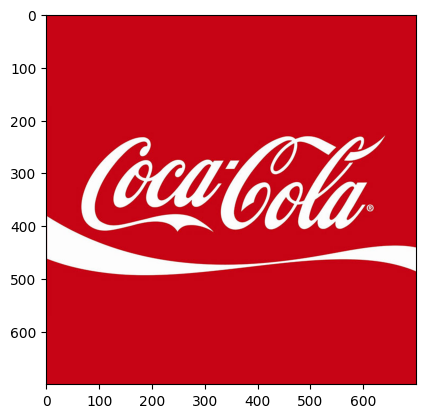

In [171]:
img_bgr = cv.imread("images/coca-cola-logo.png")
img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)
plt.imshow(img_rgb)

print(img_rgb.shape)

logo_w = img_rgb.shape[0]
logo_h = img_rgb.shape[1]

**Read Background image**

(700, 700, 3)


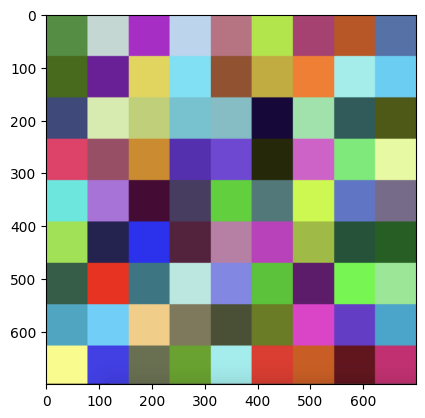

In [174]:
# Read in image of color cheackerboad background
img_background_bgr = cv.imread("images/checkerboard_color.png")
img_background_rgb = cv.cvtColor(img_background_bgr, cv.COLOR_BGR2RGB)

# Set desired width (logo_w) and maintain image aspect ratio
aspect_ratio = logo_w / img_background_rgb.shape[1]
dim = (logo_w, int(img_background_rgb.shape[0] * aspect_ratio))

# Resize background image to sae size as logo image
img_background_rgb = cv.resize(img_background_rgb, dim, interpolation=cv.INTER_AREA)

plt.imshow(img_background_rgb)
print(img_background_rgb.shape)

**Create Mask for original Image**

(700, 700)


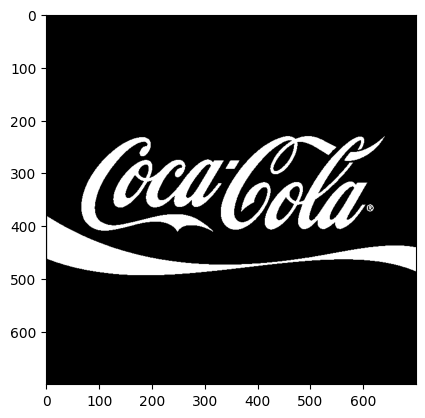

In [175]:
img_gray = cv.cvtColor(img_rgb, cv.COLOR_RGB2GRAY)

# Apply global thresholding to creat a binary mask of the logo
retval, img_mask = cv.threshold(img_gray, 127, 255, cv.THRESH_BINARY)

plt.imshow(img_mask, cmap="gray")
print(img_mask.shape)

**Invert the Mask**

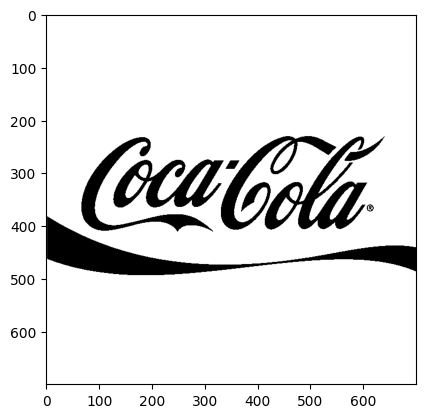

In [176]:
# Create an inverse mask
img_mask_inv = cv.bitwise_not(img_mask)
plt.imshow(img_mask_inv, cmap="gray")

**Apply background on the Mask**

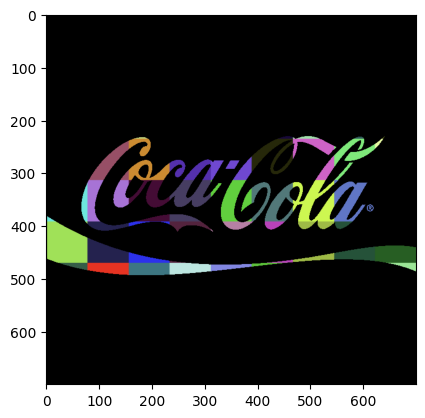

In [177]:
# Create colorful background "behind" the logo lettering
img_background = cv.bitwise_and(img_background_rgb, img_background_rgb, mask=img_mask)
plt.imshow(img_background)

**Isolate foreground from image**

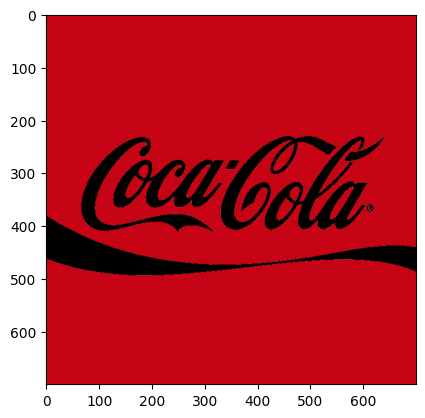

In [178]:
# Isolate foreground (red from original image) using the inverse mask
img_foreground = cv.bitwise_and(img_rgb, img_rgb, mask=img_mask_inv)
plt.imshow(img_foreground)

**Result: Merge Foreground and Background**

True

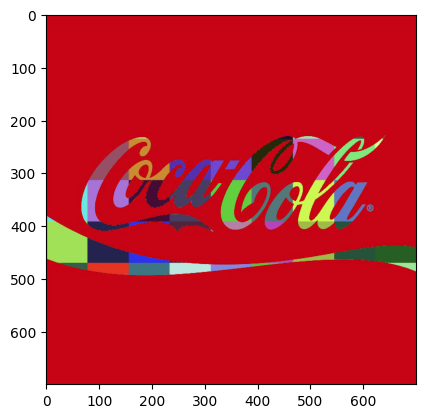

In [180]:
# Add the two previous results obtain the final result
result = cv.add(img_background, img_foreground)
plt.imshow(result)

img_output_path = os.path.join(target_directory, "logo_final.png")
cv.imwrite(img_output_path, result[:, :, ::-1])